In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')   
import plotly.express as px

In [2]:
DATA_DIR = '../data/pcos_prediction_dataset.csv'

df = pd.read_csv(DATA_DIR)
df.head()

,Country,Age,BMI,Menstrual Regularity,Hirsutism,Acne Severity,Family History of PCOS,Insulin Resistance,Lifestyle Score,Stress Levels,Urban/Rural,Socioeconomic Status,Awareness of PCOS,Fertility Concerns,Undiagnosed PCOS Likelihood,Ethnicity,Diagnosis
0,Madagascar,26,Overweight,Regular,Yes,Severe,Yes,Yes,2,Low,Rural,High,Yes,No,0.107938,Hispanic,Yes
1,Vietnam,16,Underweight,Regular,Yes,NaN,No,Yes,4,High,Rural,Middle,Yes,No,0.156729,Other,No
2,Somalia,41,Normal,Regular,No,Moderate,No,No,7,Medium,Urban,Middle,Yes,Yes,0.202901,Other,No
3,Malawi,27,Normal,Irregular,No,Mild,No,No,10,Low,Urban,High,Yes,No,0.073926,Caucasian,Yes
4,France,26,Overweight,Irregular,Yes,NaN,No,No,7,Medium,Urban,Middle,No,No,0.229266,Caucasian,No


In [3]:
df.shape

(120000, 17)

In [4]:
df.info()
##There are some null values in the acne severity column

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 120000 entries, 0 to 119999
Data columns (total 17 columns):
 #   Column                       Non-Null Count   Dtype  
---  ------                       --------------   -----  
 0   Country                      120000 non-null  object 
 1   Age                          120000 non-null  int64  
 2   BMI                          120000 non-null  object 
 3   Menstrual Regularity         120000 non-null  object 
 4   Hirsutism                    120000 non-null  object 
 5   Acne Severity                59915 non-null   object 
 6   Family History of PCOS       120000 non-null  object 
 7   Insulin Resistance           120000 non-null  object 
 8   Lifestyle Score              120000 non-null  int64  
 9   Stress Levels                120000 non-null  object 
 10  Urban/Rural                  120000 non-null  object 
 11  Socioeconomic Status         120000 non-null  object 
 12  Awareness of PCOS            120000 non-null  object 
 13 

In [5]:
df.describe()

,Age,Lifestyle Score,Undiagnosed PCOS Likelihood
count,120000.000000,120000.000000,120000.000000
mean,31.980508,5.506567,0.149937
std,10.096799,2.871052,0.057786
min,15.000000,1.000000,0.050001
25%,23.000000,3.000000,0.099820
50%,32.000000,6.000000,0.149844
75%,41.000000,8.000000,0.200061
max,49.000000,10.000000,0.249998


In [6]:
df.describe(exclude='number')

,Country,BMI,Menstrual Regularity,Hirsutism,Acne Severity,Family History of PCOS,Insulin Resistance,Stress Levels,Urban/Rural,Socioeconomic Status,Awareness of PCOS,Fertility Concerns,Ethnicity,Diagnosis
count,120000,120000,120000,120000,59915,120000,120000,120000,120000,120000,120000,120000,120000,120000
unique,77,4,2,2,3,2,2,3,2,3,2,2,5,2
top,Burkina Faso,Normal,Regular,No,Mild,No,No,Medium,Urban,Middle,Yes,No,African,No
freq,1667,60080,83941,72039,35822,84028,90183,59959,83943,59860,71891,72205,24285,107405


In [7]:
df['Acne Severity'].value_counts(dropna=False)
#60 thousand null values i.e half of the rows
#We can assume that those are the people who dont have Acne severity hence we will be filling these null values with NA


Acne Severity
NaN         60085
Mild        35822
Moderate    18072
Severe       6021
Name: count, dtype: int64

In [8]:
df['Acne Severity'].fillna(value='NA',inplace=True)


In [15]:
df.isna().sum()

Country                        0
Age                            0
BMI                            0
Menstrual Regularity           0
Hirsutism                      0
Acne Severity                  0
Family History of PCOS         0
Insulin Resistance             0
Lifestyle Score                0
Stress Levels                  0
Urban/Rural                    0
Socioeconomic Status           0
Awareness of PCOS              0
Fertility Concerns             0
Undiagnosed PCOS Likelihood    0
Ethnicity                      0
Diagnosis                      0
dtype: int64

In [9]:
df_train = df
import plotly.express as px
from plotly.subplots import make_subplots


num_vars = df.select_dtypes(include=['int', 'float']).columns.tolist()

num_cols = len(num_vars)
num_rows = (num_cols + 2) // 3

fig = make_subplots(rows=num_rows, cols=3, subplot_titles=num_vars)

for i, var in enumerate(num_vars):
    row_num = (i // 3) + 1
    col_num = (i % 3) + 1
    fig.add_trace(px.box(x=df[var]).data[0], row=row_num, col=col_num)

fig.update_layout(title_text="Box Plots for Numerical Variables", showlegend=False)
fig.show()


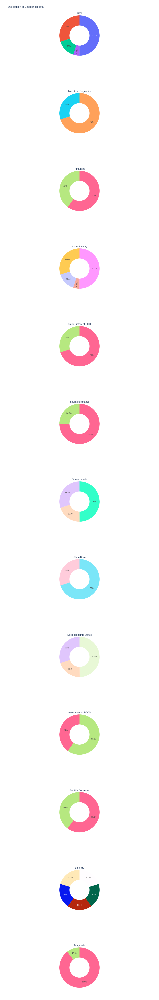

In [10]:
def plot_categorical_data(df):

    #import the required libraries for the plots
    from plotly.subplots import make_subplots
    import plotly.graph_objects as go
    
    #make a list of cat columns from dataframe
    cat_cols = df.select_dtypes("object").columns.to_list()[1:]
    
    #create a subplotfig
    fig = make_subplots(rows=len(cat_cols),cols=1,subplot_titles=cat_cols,specs=[[{'type':'pie'}] for _ in cat_cols])


    # Iterate through each categorical column
    for i, col in enumerate(cat_cols, 1):
        # Create a pie chart for the current column
        labels = df[col].value_counts().index.tolist()
        values = df[col].value_counts().tolist()
    
        pie_chart = go.Pie(labels=labels, values=values, hole=0.5, name=col)
    
        # Add the pie chart to the subplot
        fig.add_trace(pie_chart, row=i, col=1)
    
        # Add annotation with the column name to the center of the pie chart
        fig.update_annotations(
            annotation_text=col,
            selector=dict(text='center'),
            row=i, col=1,font=dict(color="white", size=16)
        )

    # Update layout for better spacing
    fig.update_layout(height=len(cat_cols) * 500, showlegend=False,width=800,title="Distribution of Categorical data")

    fig.show()
plot_categorical_data(df_train)

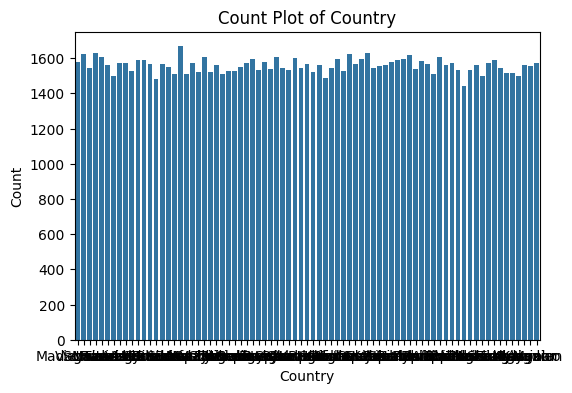

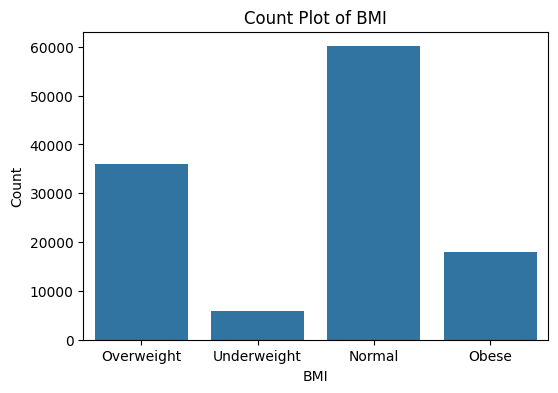

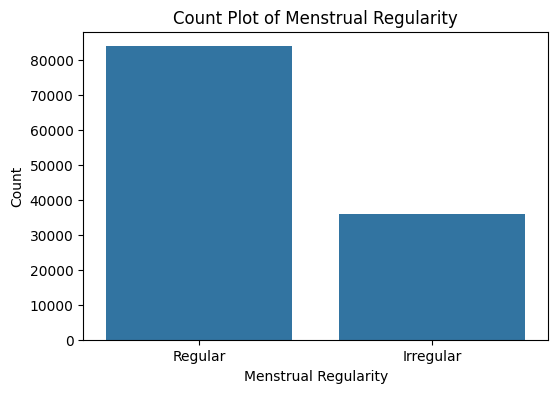

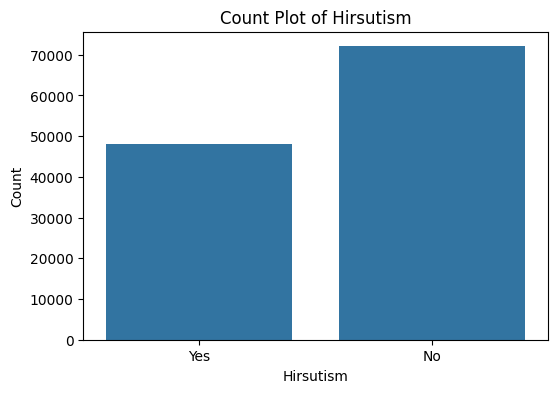

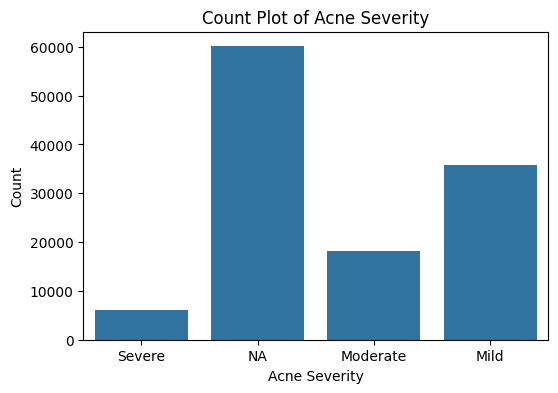

...

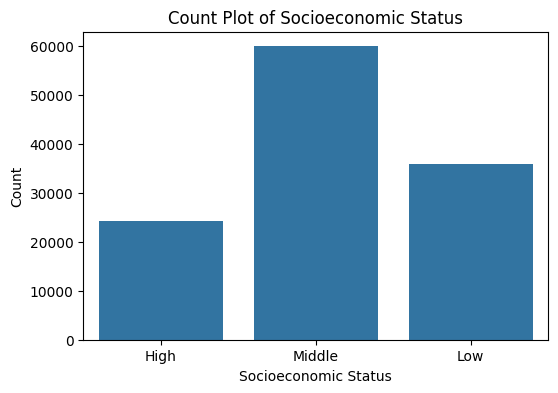

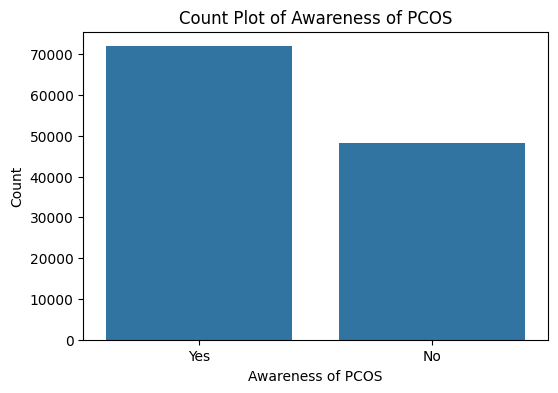

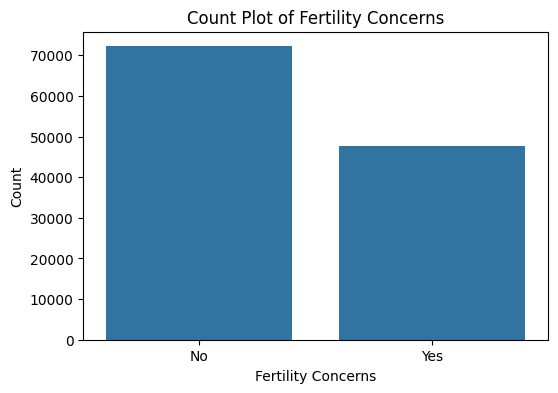

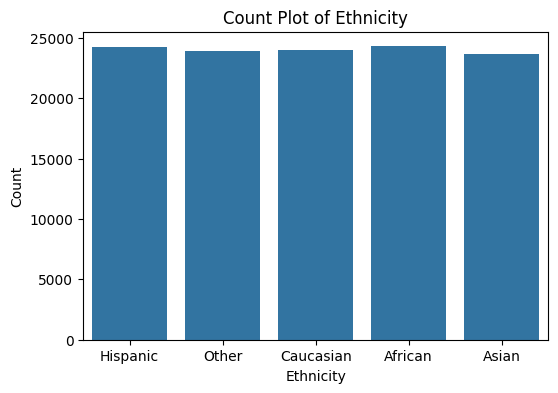

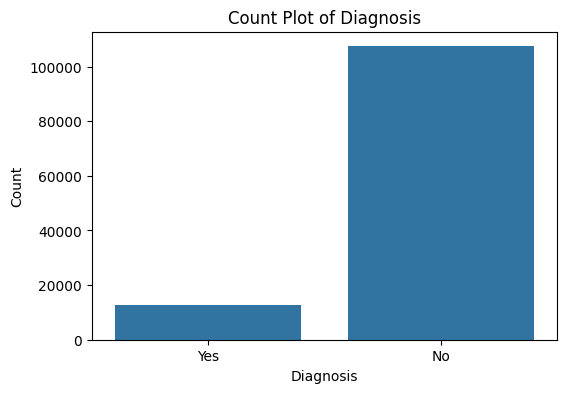

In [11]:
cat_cols = df.select_dtypes("object").columns.to_list()

for col in cat_cols:
    plt.figure(figsize=(6, 4))
    sns.countplot(x=col, data=df)
    plt.title(f'Count Plot of {col}')
    plt.xlabel(col)
    plt.ylabel('Count')
    plt.show()

<Axes: xlabel='Age', ylabel='Count'>

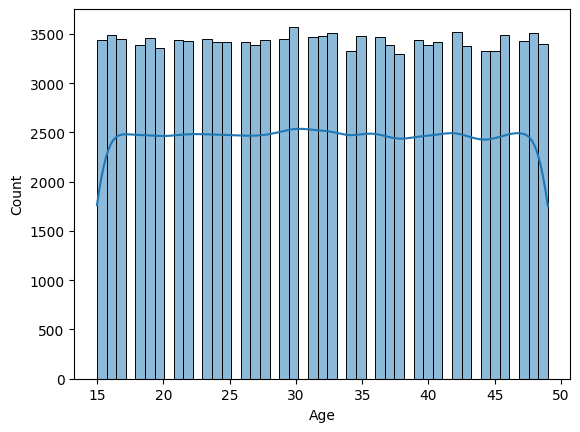

In [12]:
sns.histplot(df['Age'],kde=True)

<Axes: >

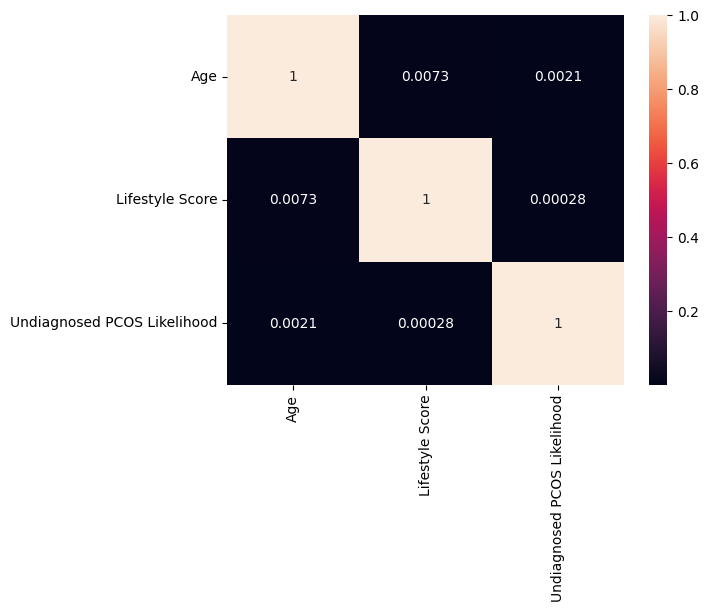

In [13]:
num_cols = df.select_dtypes("number").columns.to_list()
sns.heatmap(df[num_cols].corr(),annot=True)
## no correlation amoung numerical values

In [16]:
DIR = '../data/cleaned_data.csv'
df.to_csv(DIR,index=False)